In [1]:
from cartoGRAPHs import *
import random 
from sklearn.decomposition import PCA
from sklearn import preprocessing
import json
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt 
import colorsys
import pickle as pk

_____
# E E N / exposure-exposure network 
_____

In [2]:
G = nx.read_weighted_edgelist("output/backbone_exp_graph_significant_weighted.edgelist")
print('G nodes: ',len(G.nodes())) 
print('G edges: ',len(G.edges()))

with open('output/Communities/Louvain/weighted_ee_ji_first_louvain_iteration_exposures.pickle', 'rb') as handle:
    first_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/weighted_ee_ji_second_louvain_iteration_exposures.pickle', 'rb') as handle:
    second_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/weighted_ee_ji_third_louvain_iteration_exposures.pickle', 'rb') as handle:
    third_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/weighted_ee_ji_first_louvain_iteration.pickle', 'rb') as handle:
    ee_first_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/weighted_ee_ji_second_louvain_iteration.pickle', 'rb') as handle:
    ee_second_level_louvain = pickle.load(handle)



G nodes:  9764
G edges:  736470


### calculate features based on communities 
+ #1 THIRD LEVEL COMMUNITIES 

In [3]:
exp_list=[]
for exp_l in third_level_louvain.values():
    for e in exp_l:
        exp_list.append(e)
print(len(exp_list))

9764


In [4]:
layout_method = 'third-level-louvain' 

d_comm_third = {}
for g in G.nodes():
    for k,v in third_level_louvain.items():
        if g in v:
            d_comm_third[g] = k

d_communities_third = {}
for g in G.nodes():
    intermed_list = [0]*len(third_level_louvain.keys())
    for k,v in third_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_third[g] = intermed_list
d_nodefeatures_third = d_comm_third

FM_communities_third = pd.DataFrame(d_communities_third).T

print(len(third_level_louvain))
FM_communities_third

125


,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
C534883,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #2 SECOND LEVEL COMMUNITITES

In [5]:
layout_method = 'second-level-louvain' 

d_comm_second = {}
for g in G.nodes():
    for k,v in second_level_louvain.items():
        if g in v:
            d_comm_second[g] = k

d_communities_second = {}
for g in G.nodes():
    intermed_list = [0]*len(second_level_louvain.keys())
    for k,v in second_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_second[g] = intermed_list
d_nodefeatures_second = d_comm_second

FM_communities_second = pd.DataFrame(d_communities_second).T

print(len(second_level_louvain))
FM_communities_second

152


,0,1,2,3,4,5,6,7,8,9,...,142,143,144,145,146,147,148,149,150,151
C534883,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


+ #3 FIRST LEVEL COMMUNITIES

In [6]:
layout_method = 'first-level-louvain' 

d_comm_first = {}
for g in G.nodes():
    for k,v in first_level_louvain.items():
        if g in v:
            d_comm_first[g] = k

d_communities_first = {}
for g in G.nodes():
    intermed_list = [0]*len(first_level_louvain.keys())
    for k,v in first_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_first[g] = intermed_list
d_nodefeatures_first = d_comm_first

FM_communities_first = pd.DataFrame(d_communities_first).T

print(len(first_level_louvain))
FM_communities_first

456


,0,1,2,3,4,5,6,7,8,9,...,446,447,448,449,450,451,452,453,454,455
C534883,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
r = 0.9
alpha = 1.0

A = nx.adjacency_matrix(G, nodelist=list(G.nodes()))
DM_m = rnd_walk_matrix2(A, r, alpha, len(G.nodes()))
FM_structural = pd.DataFrame(DM_m)
FM_structural.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural.index=list(G.nodes())
FM_structural.columns=list(G.nodes())
FM_structural

,C534883,C116515,C014218,C581356,C560905,C513485,C048336,C018258,C003524,C004759,...,D004151,C512119,C120841,C025727,D005182,D005486,C507351,C036615,C037657,C051521
C534883,0.900113,3.669356e-04,0.000200,0.000459,0.000406,0.000393,0.001605,2.832925e-04,3.717560e-04,4.377895e-04,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C116515,0.001996,9.000906e-01,0.000254,0.000001,0.000002,0.000462,0.000012,8.813719e-07,1.554304e-03,6.340628e-04,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C014218,0.001593,3.712092e-04,0.900053,0.000004,0.000004,0.000395,0.000005,9.669170e-07,3.758368e-04,4.417640e-04,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C581356,0.000907,3.818991e-07,0.000001,0.900093,0.000606,0.000001,0.000038,7.304205e-06,3.864733e-07,4.527043e-07,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C560905,0.000910,7.872922e-07,0.000001,0.000689,0.900082,0.000006,0.000040,7.376565e-06,7.960605e-07,9.322654e-07,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.090909,0.909091,0.000000,0.000000,0.000000,0.000000
C507351,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.909091,0.090909,0.000000,0.000000
C036615,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.090909,0.909091,0.000000,0.000000
C037657,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.909091,0.090909


___ 
# 1 VIS 1 - Visualizing 1 selected community of each level
___

## Complete EEN network - Vis

In [8]:
########################################
# select which level :
########################################

layoutname = 'thirdlevel'
x_level_louvain = third_level_louvain
d_comm = d_comm_third
FM_communities = FM_communities_third

# set visualization parameters (i.e. colors for communities, node size, features.. )
colorlist_verybright = ['#FF355E','#FF6037','#FF9933',
               '#FFCC33', '#FFFF66', '#CCFF00','#A7F432',
                '#AAF0D1', '#50BFE6', '#FF6EFF',
                '#FF00CC', 
]

colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = colorlist_paper * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper

# #try to get unique colors for each community instead of hardcoded colors 
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_louvain.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
# random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_louvain.keys(), colorlist_fin))
print(len(d_comm_col))

# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25

edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'

# get all subgraphs of all communities : 
nodes_allcommunities = []
subgraphs_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):

    nodes_comm0 = []
    for node, comm in d_comm.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_allcommunities.append(nodes_comm0)
    subgraphs_allcommunities.append(G_comm0)

number of unique colors: 16
125


In [14]:
len(d_comm)

9764

In [15]:
FM_communities

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
C534883,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### FEATURE MODULATED LAYOUT 
structural (global) with functional (communities)

In [9]:

scalar_val = 0.8
layout_method = 'modulated-scal'+str(scalar_val)
DF_structural = FM_structural
DF_functional = FM_communities.T
DF_merge = feature_modulation(DF_structural,DF_functional, scalar_val)

n_n = 8
spr = 1.0
md = 0.5
metr2D = 'cosine'

posG2D_modulated = layout_portrait_umap(G,
                                   DF_merge,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG2D_new = posG2D_modulated

/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [10]:
posG3D_modulated = layout_portrait_umap(G,
                                   DF_merge,
                                   3,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG3D_new = posG3D_modulated

/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [11]:
exposurome_3dpos=[]
exposurome_col=[]
exposurome_col_dict={}
for exp,pos in posG3D_new.items():
    exposurome_3dpos.append(pos)
    for i,n_comm in enumerate(nodes_allcommunities):
        if exp in n_comm:
            exposurome_col.append(d_comm_col[i])
            exposurome_col_dict[exp]=d_comm_col[i]



In [19]:
len(set(exposurome_col_dict.values()))

16

In [20]:
len(exposurome_col_dict)

9764

In [21]:

with open('output/ji_exposurome_col_dict_louvain.pickle', 'wb') as handle:
    pickle.dump(exposurome_col_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [10]:

with open ('output/ji_exposurome_col_dict_louvain.pickle', 'rb') as fp:
    ji_exposurome_col_dict_louvain = pk.load(fp)


In [22]:

np.savetxt("output/VR/Exposuromepos3d_louvain.csv", 
           exposurome_3dpos,
           delimiter =",", 
           fmt ='% s')

In [23]:
from PIL import ImageColor


In [24]:

exposurome_col_rgb=[]
for hexcol in exposurome_col:
    rgb=list(ImageColor.getcolor(hexcol, "RGB"))
    rgb.append(100)
    exposurome_col_rgb.append(rgb)

In [25]:

np.savetxt("output/VR/Exposuromecol_louvain.csv", 
           exposurome_col_rgb,
           delimiter =",", 
           fmt ='% s')

In [26]:
#I need to relabel the nodes to indexes
exposurome_map={}
exp_id_list=[]
c=0
for exp_node in posG3D_new.keys():
    exposurome_map[exp_node]=c
    exp_id_list.append(exp_node)
    c=c+1
    

In [121]:
chem_gene_df = pd.read_csv("input/CTD/CTD_chem_gene_ixns.tsv",delimiter= '\t', #import the database
            skipinitialspace=True)

#Let's define a dictionary that will convert the chemical name in chemical ID
chem_id_name_conversion = {}
for i,v in chem_gene_df.iterrows():
        chem_id_name_conversion[v["ChemicalID"]] = v["# ChemicalName"]

In [28]:
#Here, we import the lists of hub exposures, central module exposures, peripheric exposures and no hub no module exposures
#These are calculated only in the notebook regarding the PPI

hub_exposures_list=[]
central_module_exposures_list=[]
peripheric_module_exposures_list=[]
no_central_no_module_exposures_list=[]
 
# Using readlines()
file1 = open('output/Hub_expusres.txt', 'r')
Lines = file1.readlines()
for line in Lines:
    hub_exposures_list.append(line.strip("\n"))

# Using readlines()
file1 = open('output/Central_module_exposures.txt', 'r')
Lines = file1.readlines()
for line in Lines:
    central_module_exposures_list.append(line.strip("\n"))
    
# Using readlines()
file1 = open('output/Peripheric_module_exposures.txt', 'r')
Lines = file1.readlines()
for line in Lines:
    peripheric_module_exposures_list.append(line.strip("\n"))
    
# Using readlines()
file1 = open('output/No_central_no_module_exposures.txt', 'r')
Lines = file1.readlines()
for line in Lines:
    no_central_no_module_exposures_list.append(line.strip("\n"))


In [29]:
exp_modtype_dict={}

for exp in hub_exposures_list:
    exp_modtype_dict[exp]="Hub exposure"

for exp in central_module_exposures_list:
    exp_modtype_dict[exp]="Central module exposure"

for exp in peripheric_module_exposures_list:
    exp_modtype_dict[exp]="Peripheral module exposure"


for exp in no_central_no_module_exposures_list:
    exp_modtype_dict[exp]="Scattered exposure"

In [30]:
import csv

f = open('output/VR/Exposurome_properties.csv', 'w') 
wr = csv.writer(f)
for expid in list(exposurome_col_dict.keys()):
    try:
        wr.writerow([expid,str(chem_id_name_conversion[expid]),str(exp_modtype_dict[expid])])
    except:
        wr.writerow([expid,str(chem_id_name_conversion[expid]),"Scattered exposure"])
    
f.close()

In [31]:
G_indexes=nx.relabel_nodes(G, exposurome_map)

In [32]:
G_indexes.number_of_edges()

736470

In [33]:

np.savetxt("output/VR/Exposuromeedges_louvain.csv", 
           list(G_indexes.edges()),
           delimiter =",", 
           fmt ='% s')

In [34]:
Exposuromeedgescol=[]
for i in list(G_indexes.edges()):
    Exposuromeedgescol.append([144,144,144,80])
    

np.savetxt("output/VR/Exposuromeedgescol_louvain.csv", 
           Exposuromeedgescol,
           delimiter =",", 
           fmt ='% s')

In [12]:
#Let's change the names of these communities based on their size

#BROADEST==third
third_level_louvain_sort=dict(sorted(third_level_louvain.items(), key=lambda item: len(item[1]), reverse = True))
third_renamed_third_conversion_dict={}
renamed_third_level_louvain_sort={}
c=1
for com,explist in third_level_louvain_sort.items():
    renamed_third_level_louvain_sort[str(c)]=explist
    third_renamed_third_conversion_dict[com]=str(c)
    c=c+1
    
#MIDDLE==second

second_renamed_second_conversion_dict={}
renamed_second_level_louvain_sort={}

for br_com,mid_com in ee_second_level_louvain.items():
    if len(mid_com)==1:
        newcom=third_renamed_third_conversion_dict[br_com]
        renamed_second_level_louvain_sort[newcom]=second_level_louvain[mid_com[0]]
        second_renamed_second_conversion_dict[mid_com[0]]=newcom
    else:
        sorted_list=list(sorted(mid_com, key=lambda item: len(second_level_louvain[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=third_renamed_third_conversion_dict[br_com]+"_"+str(q)
            renamed_second_level_louvain_sort[newcom]=second_level_louvain[sorted_list[i]]
            second_renamed_second_conversion_dict[sorted_list[i]]=newcom
        
#FINEST==first  

first_renamed_first_conversion_dict={}
renamed_first_level_louvain_sort={}

for mid_com,fin_com in ee_first_level_louvain.items():
    if len(fin_com)==1:
        newcom=second_renamed_second_conversion_dict[mid_com]
        renamed_first_level_louvain_sort[newcom]=first_level_louvain[fin_com[0]]
        first_renamed_first_conversion_dict[fin_com[0]]=newcom
    else:
        sorted_list=list(sorted(fin_com, key=lambda item: len(first_level_louvain[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=second_renamed_second_conversion_dict[mid_com]+"_"+str(q)
            renamed_first_level_louvain_sort[newcom]=first_level_louvain[sorted_list[i]]
            first_renamed_first_conversion_dict[sorted_list[i]]=newcom
        

In [13]:
third_renamed_third_conversion_dict_rev={}
for k,v in third_renamed_third_conversion_dict.items():
    third_renamed_third_conversion_dict_rev[v]=k

second_renamed_second_conversion_dict_rev={}
for k,v in second_renamed_second_conversion_dict.items():
    second_renamed_second_conversion_dict_rev[v]=k

first_renamed_first_conversion_dict_rev={}
for k,v in first_renamed_first_conversion_dict.items():
    first_renamed_first_conversion_dict_rev[v]=k

In [14]:
tot_v=[]
for k,v in renamed_second_level_louvain_sort.items():
    tot_v.extend(v)
len(tot_v)

9764

In [19]:
tremap_color_dict={}
for com,explist in renamed_third_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)

for com,explist in renamed_second_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
        
for com,explist in renamed_first_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
len(tremap_color_dict)

519

In [20]:
for k,v in renamed_second_level_louvain_sort.items():
    if 'D000078306' in v:
        print(k)

11_2


In [21]:

color_list=[]
com_list=[]
value_list=[]
parent_list=[]

for com, color in tremap_color_dict.items():
    com_list.append(com)
    color_list.append(color)
    
    comgrouplist=com.split("_")
    if len(comgrouplist)==1:
        value_list.append(len(renamed_third_level_louvain_sort[com]))
        parent_list.append("")
    
    elif len(comgrouplist)==2:
        try:
            value_list.append(len(renamed_second_level_louvain_sort[com]))
            oldcom=second_renamed_second_conversion_dict_rev[com]
            for brcom,midcomlist in ee_second_level_louvain.items():
                if oldcom in midcomlist:
                    parent_list.append(third_renamed_third_conversion_dict[brcom])
        except:
            value_list.append(len(renamed_first_level_louvain_sort[com]))
            oldcom=first_renamed_first_conversion_dict_rev[com]
            for midcom,fincomlist in ee_first_level_louvain.items():
                if oldcom in fincomlist:
                    parent_list.append(second_renamed_second_conversion_dict[midcom])
            
        
    else:
        value_list.append(len(renamed_first_level_louvain_sort[com]))
        oldcom=first_renamed_first_conversion_dict_rev[com]
        for midcom,fincomlist in ee_first_level_louvain.items():
            if oldcom in fincomlist:
                parent_list.append(second_renamed_second_conversion_dict[midcom])
        

In [22]:
for k,v in renamed_first_level_louvain_sort.items():
    if 'D000078306' in v:
        print(k)

11_2_1


In [23]:
import plotly.graph_objects as go


fig = go.Figure(go.Treemap(
    branchvalues = "total",
    labels = com_list,
    values = value_list,
    parents = parent_list,
    marker_colors = color_list
))

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
#fig.write_image('output/Figures/Fig2B_v01_post_rev.pdf')
fig.show()

In [24]:
# --- build source data table ---
source_df = pd.DataFrame({
    "label": com_list,
    "parent": parent_list,
    "value": value_list,
    "color": color_list
})


# optional metadata (recommended)
source_df["figure"] = "Fig2B"
source_df["description"] = "Treemap of the EEN"

# --- write to excel ---
with pd.ExcelWriter("output/Source_Data_exposurome.xlsx", engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    source_df.to_excel(writer, sheet_name="Fig2B", index=False)
print("Source data for treemap exported.")

Source data for treemap exported.


In [52]:
for k,v in renamed_third_level_louvain_sort.items():
    if 'D000078306' in v:
        print(k)

11


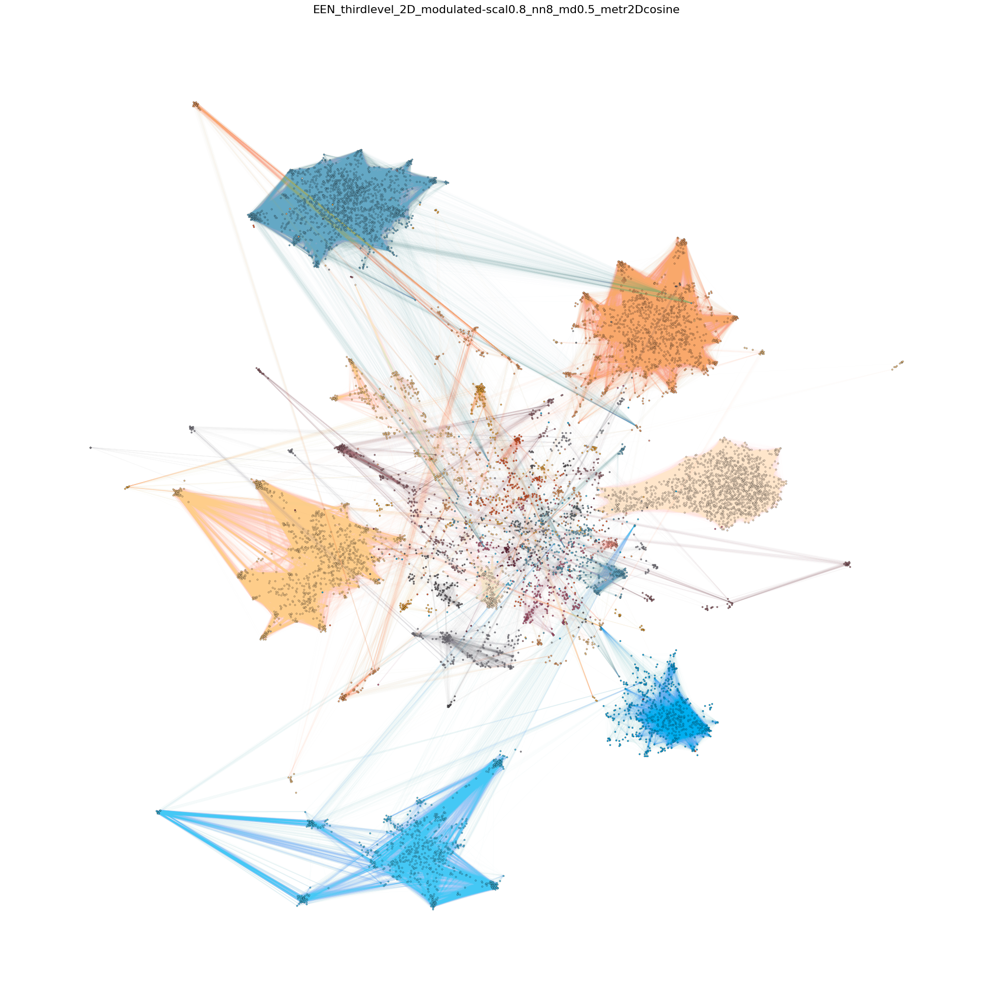

In [12]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# all edges 
nx.draw_networkx_edges(G,posG2D_new, width = 0.05, edge_color = '#a9a9a9', alpha = 0.01)


# draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 1, edge_color = colors_allcommunities[i], alpha = 0.01)

plt.box(False)

#plt.savefig('output/Figures/Fig2A_part1_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/Fig2A_part1_v01_post_rev.png',dpi=300)
#plt.savefig('output/Figures/Fig2A_part1_v01_post_rev.svg',dpi=300)
plt.show()

In [ ]:
#Let's recover the original node position

In [33]:
import re

def extract_use_positions(svg_path):
    with open(svg_path, "r", encoding="utf-8") as f:
        svg = f.read()

    # match <use ... x="..." y="...">
    matches = re.findall(
        r'<use[^>]*x="([\d\.\-eE]+)"[^>]*y="([\d\.\-eE]+)"',
        svg
    )

    coords = [(float(x), float(y)) for x, y in matches]

    print("Recovered <use> markers:", len(coords))
    return coords

In [34]:
# order nodes exactly as drawn
node_draw_order = []

for subg in subgraphs_allcommunities:
    node_draw_order.extend(list(subg.nodes()))

In [35]:
coords = extract_use_positions("output/Figures/Fig2A_part1_v01_post_rev.svg")

print(len(coords), "coords vs", len(node_draw_order), "nodes")

pos_recovered = {
    node: coords[i]
    for i, node in enumerate(node_draw_order)
}

Recovered <use> markers: 9764
9764 coords vs 9764 nodes


In [36]:
ys = [y for x, y in pos_recovered.values()]
ymax = max(ys)

pos_recovered = {
    n: (x, ymax - y)
    for n, (x, y) in pos_recovered.items()
}

In [40]:
posG2D_new = pos_recovered

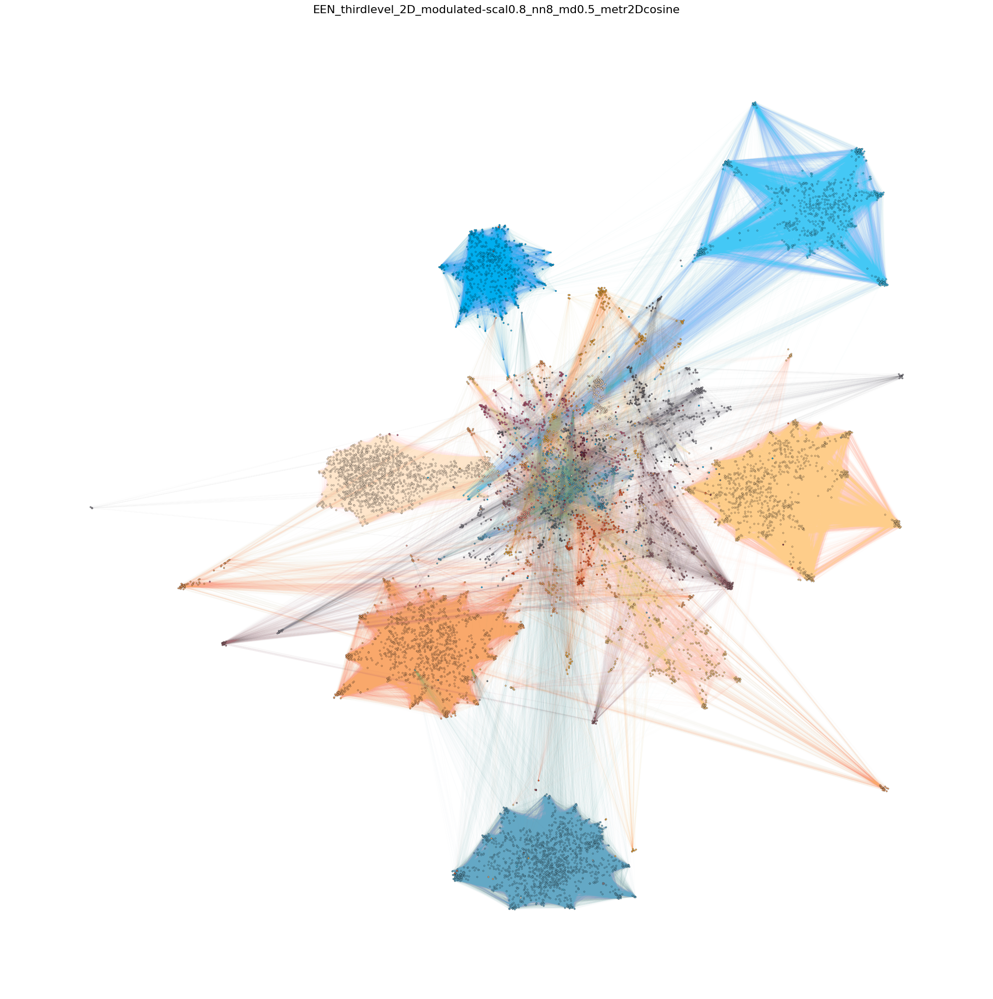

In [41]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# all edges 
nx.draw_networkx_edges(G,posG2D_new, width = 0.05, edge_color = '#a9a9a9', alpha = 0.01)


# draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 1, edge_color = colors_allcommunities[i], alpha = 0.01)

plt.box(False)

#plt.savefig('output/Figures/Fig2A_part1_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/Fig2A_part1_v01_post_rev.png',dpi=300)
#plt.savefig('output/Figures/Fig2A_part1_v01_post_rev.svg',dpi=300)
plt.show()

In [42]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_new.items():

    community_id = d_comm.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 5,
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })


# ----------------------------
# EDGES (ALL EDGES)
# ----------------------------
for u, v in G.edges():

    comm_u = d_comm.get(u)
    comm_v = d_comm.get(v)

    # determine edge style exactly like plot
    if comm_u == comm_v:
        edge_color = d_comm_col.get(comm_u)
        edge_width = 1
    else:
        edge_color = "#a9a9a9"
        edge_width = 0.05

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width
    })


df_network = pd.DataFrame(rows)


# ----------------------------
# SAVE SAFELY (append, no overwrite)
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(
    out_file,
    engine="openpyxl",
    mode="a",
    if_sheet_exists="replace"   # SAFE
) as writer:

    df_network.to_excel(
        writer,
        sheet_name="Fig2A_part1",
        index=False
    )

print("Network source data saved safely.")

Network source data saved safely.


In [60]:
#We want to focus on the community '11' (old community 6) 
check_colors_allcommunities=[]
for i in range(len(colors_allcommunities)):
    if i==6:
        check_colors_allcommunities.append(d_comm_col[6])
    else:
        check_colors_allcommunities.append("grey")

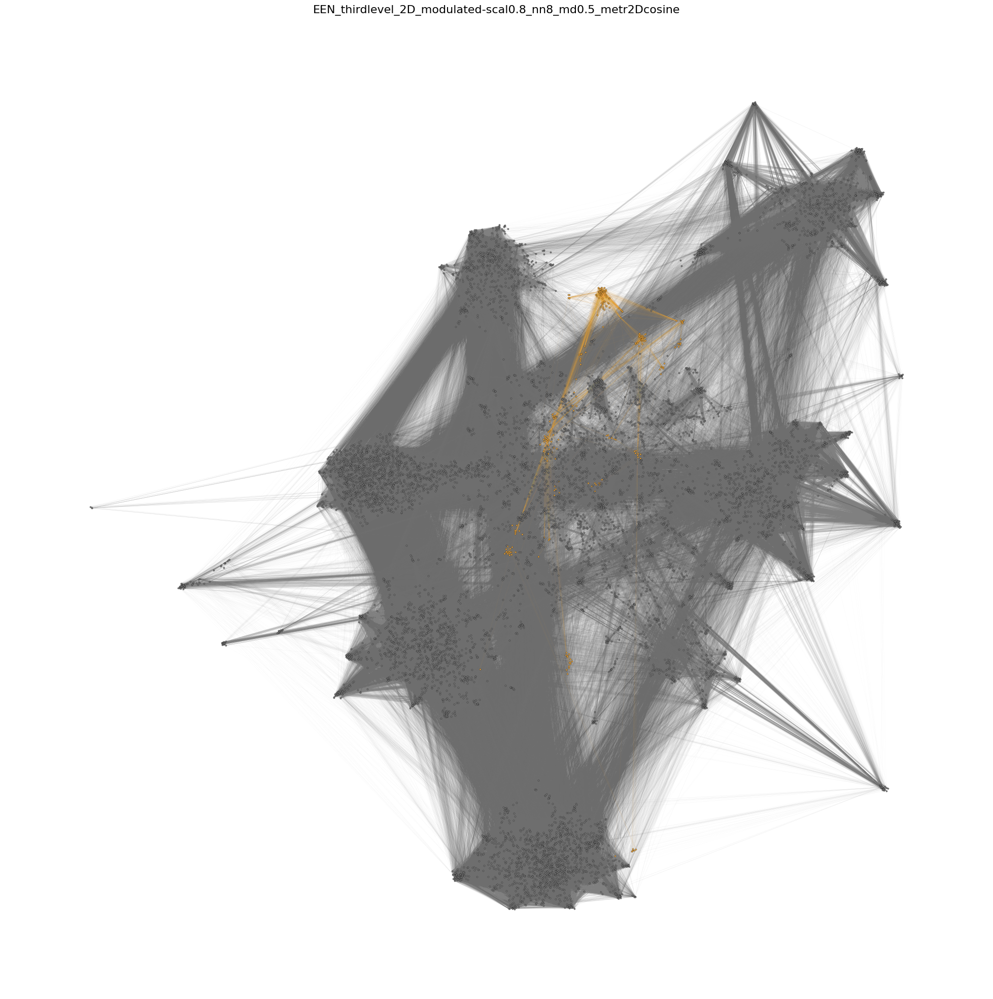

In [61]:
fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = check_colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color = check_colors_allcommunities[i], alpha = 0.075)

plt.box(False)

#plt.savefig(path+fname+'focus.png',dpi=300)
plt.show()

In [44]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

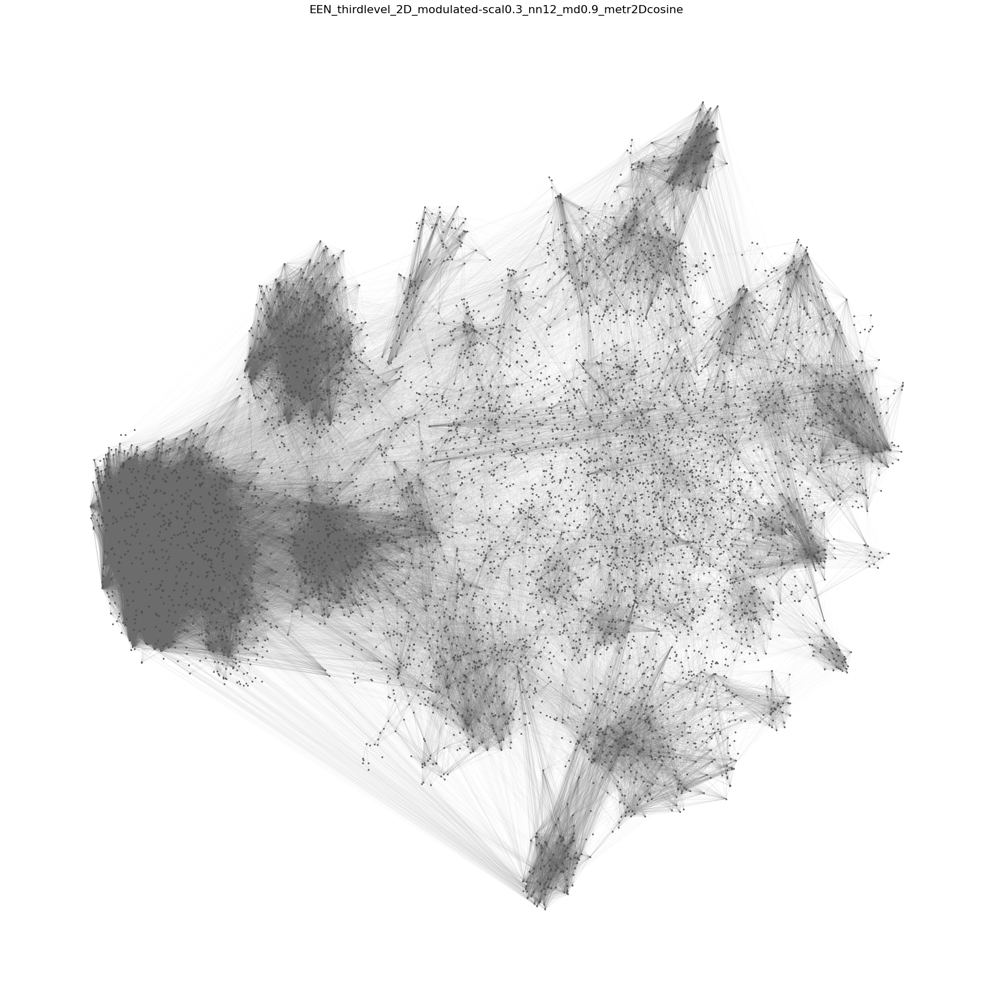

In [15]:
fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = '#6C6C6C', node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color ='#6C6C6C', alpha = 0.075)

plt.box(False)

#plt.savefig(path+fname+'focus.png',dpi=300)
plt.show()

# Specific Communities per Level - Vis

### THIRD LEVEL

Number of exposures in community: 266
Specific Graph: Graph with 266 nodes and 3201 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1401: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_third nodes):  266
communities of second level in third level community selected:  {7, 48, 31, 30, 127}
colorlist fin: ['#64a8c5', '#ffe6cb', '#c65d7d', '#93909a', '#7a2d45']
number of unique colors: 5
Number of subgraphs: 5
Number of second level communities:  5
Number of position-sublists: 5


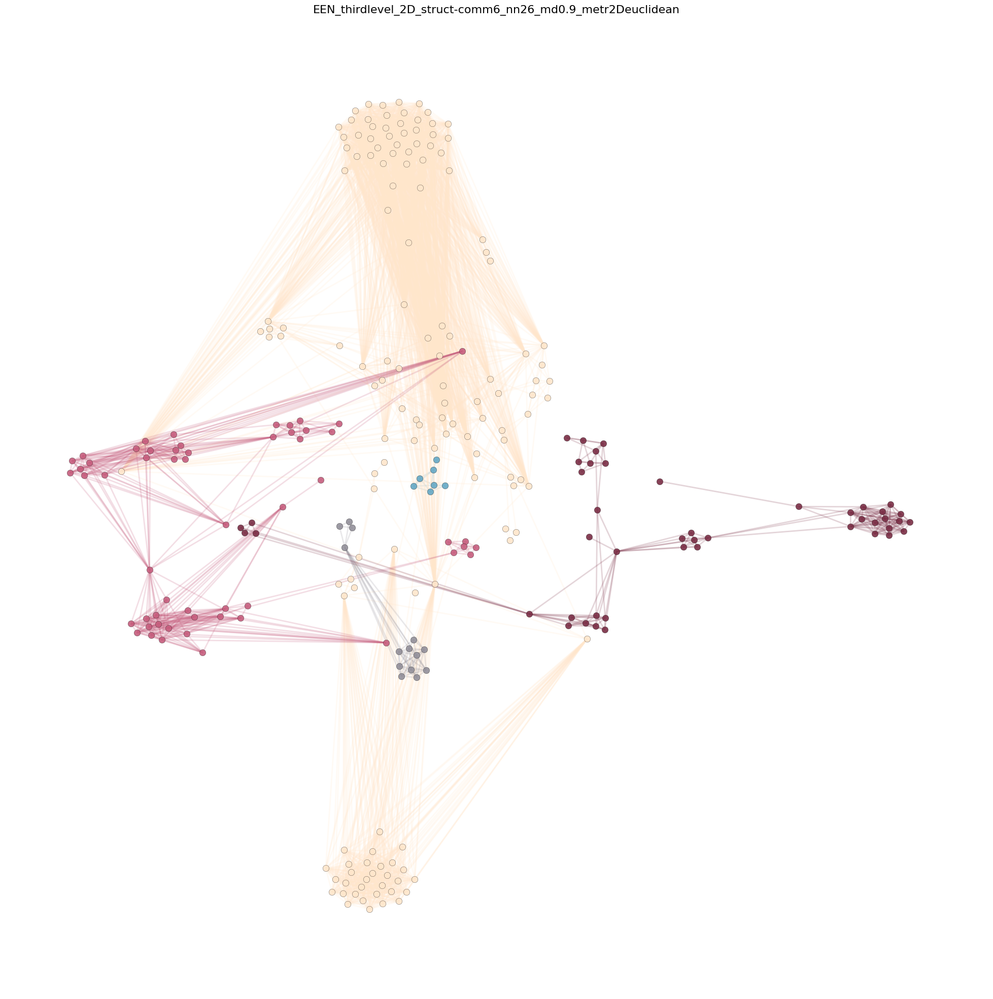

In [74]:
layoutname = 'thirdlevel'

##########################################################
spec_comm_third = 6 #Salvo's selection 6
##########################################################

sublist_third = []
for k,v in d_comm_third.items():
    if v == spec_comm_third:
        sublist_third.append(k)

d_selectedcommunity_thirdlevel = {spec_comm_third:sublist_third}
print("Number of exposures in community:" , len(*d_selectedcommunity_thirdlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_third.values()),max(d_comm_third.values())):
    nodes_comm0 = []
    for node, comm in d_comm_third.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_subcommunities.append(nodes_comm0)
    subgraphs_subcommunities.append(G_comm0)
    
G_sub_third = subgraphs_subcommunities[spec_comm_third]
print("Specific Graph:" , G_sub_third)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_third) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_third, nodelist=list(G_sub_third.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_third.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_third.nodes())
FM_structural_sub.columns=list(G_sub_third.nodes())

n_n = 26 
spr = 20
md = 0.9
metr2D = 'euclidean'
posG2D_third = layout_portrait_umap(G_sub_third,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_third nodes): ', len(posG2D_third))



########################################
# COLORS 
########################################

# get all nodes of 3rd level subgraph - and their second level assigned communities
d_comm_second_selected = {}
for node in G_sub_third.nodes():
    if node in d_comm_second.keys():    
        d_comm_second_selected[node] = d_comm_second[node]
print("communities of second level in third level community selected: ", set(d_comm_second_selected.values()))

set_communities = set(d_comm_second_selected.values())




colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = [colorlist_paper[2],colorlist_paper[5],colorlist_paper[8],colorlist_paper[14],colorlist_paper[10]] # * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper
print("colorlist fin:" , colorlist_fin)
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_louvain.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))



opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'



########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_secondlevel = []
subgraphs_allcommunities_secondlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_secondlevel.append(nodes_comm)
    subgraphs_allcommunities_secondlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_secondlevel))
print("Number of second level communities: ", len(nodes_allcommunities_secondlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items():
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_secondlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_secondlevel))

# colors_allcommunities_secondlevel = []
# for idx,number_of_community in enumerate(list(set_communities)):
#     for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
#         # get color from community  
#         for comm, col in d_comm_col.items():
#             if comm == number_of_community:
#                 comm0_color = col
#     colors_allcommunities_secondlevel.append(comm0_color)

# print("Number of individual colors: ", len(set(colors_allcommunities_secondlevel)))
# print("colors_allcommunities_secondlevel: ", colors_allcommunities_secondlevel)
colors_allcommunities_secondlevel = colorlist_fin
########################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
d_comm_col = {}
for i in range(len(set_communities)):
    d_comm_col[list(set_communities)[i]] = colors_allcommunities_secondlevel[i]
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = colors_allcommunities_secondlevel[i], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 2, edge_color = colors_allcommunities_secondlevel[i], alpha = 0.2)

plt.box(False)


#plt.savefig('output/Figures/Fig2A_part2_v01_post_rev.pdf',dpi=300)
plt.show()


In [75]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_third.items():
    # get second-level community and color
    community_id = d_comm_second_selected.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 80,
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })

# ----------------------------
# EDGES (ALL EDGES in the subgraph)
# ----------------------------
for u, v in G_sub_third.edges():
    comm_u = d_comm_second_selected.get(u, -1)
    comm_v = d_comm_second_selected.get(v, -1)

    if comm_u == comm_v and comm_u != -1:
        edge_color = d_comm_col.get(comm_u, "#000000")
        edge_width = 2
        edge_alpha = 0.2
    else:
        edge_color = "#a9a9a9"
        edge_width = 0.1
        edge_alpha = 0.01

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })

# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork[df_subnetwork['row_type']=='node']))
print("Edges:", len(df_subnetwork[df_subnetwork['row_type']=='edge']))

# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork.to_excel(writer, sheet_name="Fig2A_part2", index=False)

print("Third-level subnetwork saved successfully in Excel!")

Nodes: 266
Edges: 3201
Third-level subnetwork saved successfully in Excel!


In [114]:
# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm_second_selected.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

d_nodecolors_hex_sorted = {key:d_nodecolors_hex[key] for key in posG2D_third}



### SECOND LEVEL

Number of exposures in community: 56
Specific Graph: Graph with 56 nodes and 347 edges
communities of second level in third level community selected:  {161, 257, 268, 51, 445}
{161: '#ffe6cb', 257: '#d2cccb', 268: '#a6b3cc', 51: '#7999cc', 445: '#4c80cc'}
Number of subgraphs: 5
Number of second level communities:  5
Number of position-sublists: 5
Number of individual colors:  5


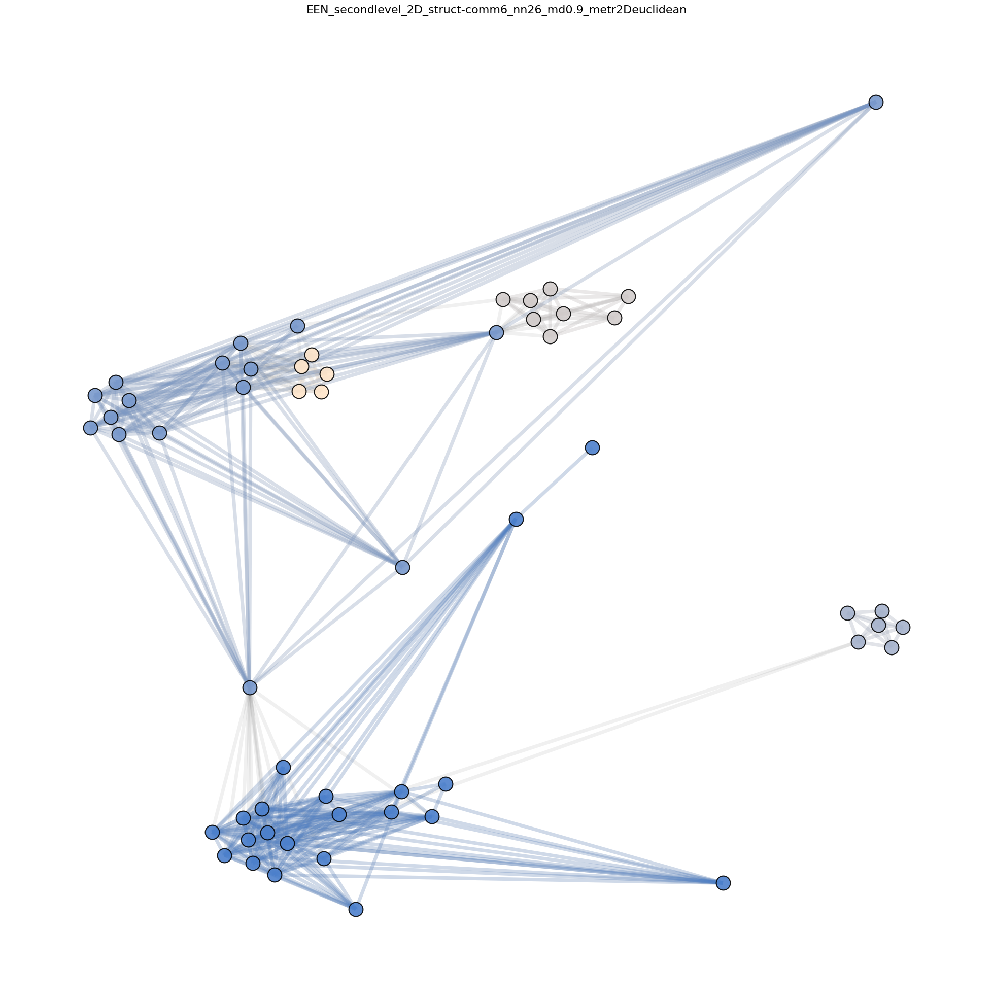

In [76]:
layoutname = 'secondlevel'

##########################################################
spec_comm_second = 31 #Salvo's selection 31 (11_2)
##########################################################


sublist_second = []
for k,v in d_comm_second.items():
    if v == spec_comm_second:
        sublist_second.append(k)

d_selectedcommunity_secondlevel = {spec_comm_second:sublist_second}
print("Number of exposures in community:" , len(*d_selectedcommunity_secondlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_second.values()),max(d_comm_second.values())):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_second = subgraphs_subcommunities[spec_comm_second]
print("Specific Graph:" , G_sub_second)


# ########################################
# # LAYOUT 
# ########################################

# layout_method = 'struct-comm'+str(spec_comm_second) 

# r = 0.9
# alpha = 1.0

# A_sub = nx.adjacency_matrix(G_sub_second, nodelist=list(G_sub_second.nodes()))
# DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_second.nodes()))
# FM_structural_sub = pd.DataFrame(DM_m_sub)
# FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
# FM_structural_sub.index=list(G_sub_second.nodes())
# FM_structural_sub.columns=list(G_sub_second.nodes())

# n_n = 50
# spr = 1.0
# md = 0.9
# metr2D = 'cosine'
# posG2D_second = layout_portrait_umap(G_sub_second,
#                                    FM_structural_sub, #FM_communities_sub, #df_posG,
#                                    2,
#                                    n_neighbors=n_n, 
#                                    spread=spr, 
#                                    min_dist=md, 
#                                    metric=metr2D
#                                   )

# print('Number of Nodes: (to match G_sub_second nodes): ', len(posG2D_second))


# # add a small number to all positions to move them away from each other 
# posG2D_third_mod = {}
# for k,v in posG2D_third.items():
#     jitter = random.uniform(0,0.02)

#     posG2D_third_mod[k] = (v[0]+jitter, v[1]+jitter)
    

########################################
# COLORS 
########################################

# get all nodes of 2nd level subgraph - and their first level assigned communities
d_comm_first_selected = {}
for node in G_sub_second.nodes():
    if node in d_comm_first.keys():    
        d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get color of community of previous level
# then generate gradients of this color based on number of communities in this level
color_previous = colorlist_fin[1] #d_comm_col[spec_comm_third]
num_colors = len(set(d_comm_first_selected.values()))
color_rgb = mcolors.hex2color(color_previous)


end_color = (0.0,0.1,0.4) # You can change this to (0, 0, 0) for a dark palette or any other color
end_color = (0.3,0.5,0.8) # You can change this to (0, 0, 0) for a dark palette or any other color


colorlist_rgb = [np.array(color_rgb) * (1 - i) + np.array(end_color) * i for i in np.linspace(0, 1, num_colors)]
colorlist_hex = [mcolors.to_hex(rgb) for rgb in colorlist_rgb]
d_comm_col = dict(zip(set_communities, colorlist_hex))
print(d_comm_col) 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_second if positions should be newly calculated
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))



#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges accross communities 
nx.draw_networkx_edges(G_sub_second, posG2D_third, width = 5, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*6, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 400, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 5.0, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)


#plt.savefig('output/Figures/Fig2A_part3_v01_post_rev.pdf',dpi=300)
plt.show()

In [77]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_third.items():  # using the same positions as in the plot
    community_id = d_comm_first_selected.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 400,  # same as plotted
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })

# ----------------------------
# EDGES (ALL EDGES in the subgraph)
# ----------------------------
for u, v in G_sub_second.edges():
    comm_u = d_comm_first_selected.get(u, -1)
    comm_v = d_comm_first_selected.get(v, -1)

    # edge style: within community vs across communities
    if comm_u == comm_v and comm_u != -1:
        edge_color = d_comm_col.get(comm_u, "#000000")
        edge_width = 5.0
        edge_alpha = 0.2
    else:
        edge_color = "#6C6C6C"
        edge_width = 5.0
        edge_alpha = 0.1

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })

# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_second = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_second[df_subnetwork_second['row_type']=='node']))
print("Edges:", len(df_subnetwork_second[df_subnetwork_second['row_type']=='edge']))

# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_second.to_excel(writer, sheet_name="Fig2A_part3", index=False)

print("Second-level subnetwork saved successfully in Excel!")

Nodes: 266
Edges: 347
Second-level subnetwork saved successfully in Excel!


### FIRST LEVEL

Number of exposures in community: 21
Specific Graph: Graph with 21 nodes and 143 edges
communities of second level in third level community selected:  {445}
{445: '#4c80cc'}
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


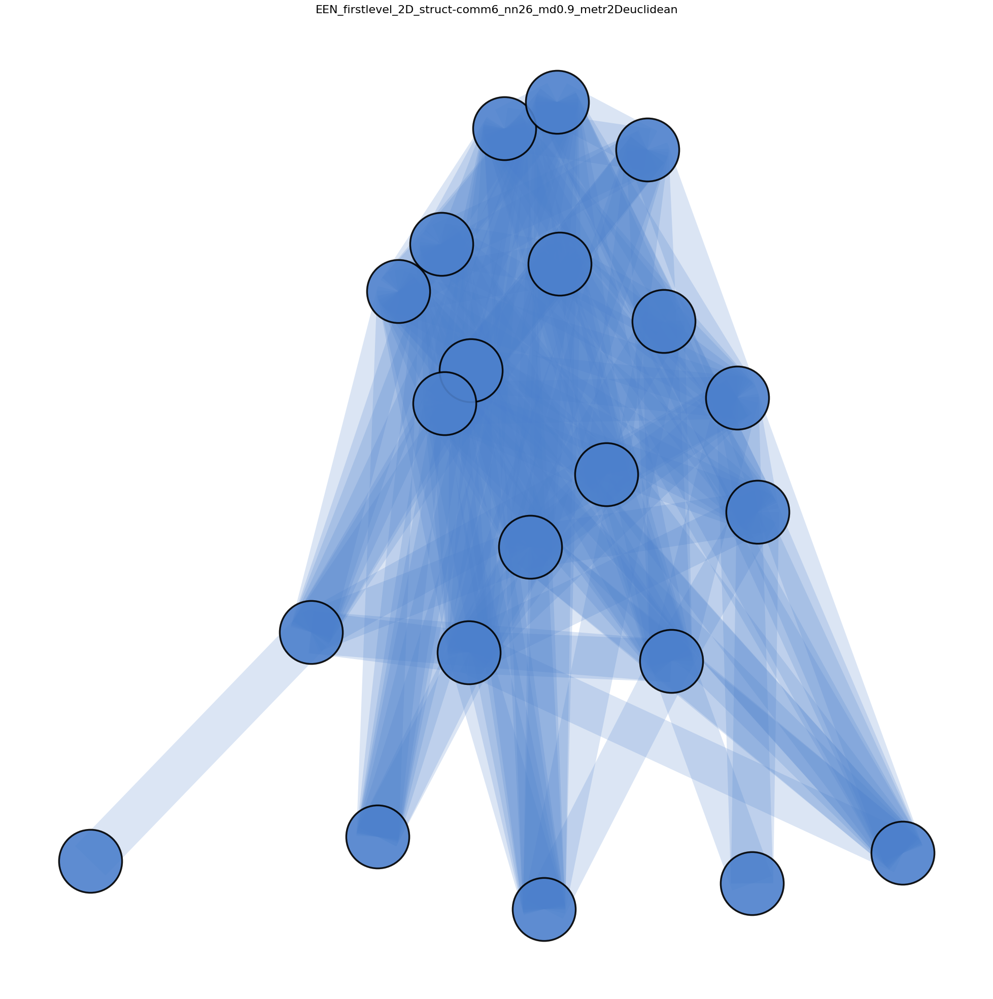

In [120]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 445 #Salvo's selection 11_2_1
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


# ########################################
# # LAYOUT 
# ########################################

# layout_method = 'struct-comm'+str(spec_comm_first) 

# r = 0.9
# alpha = 1.0

# A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
# DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
# FM_structural_sub = pd.DataFrame(DM_m_sub)
# FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
# FM_structural_sub.index=list(G_sub_first.nodes())
# FM_structural_sub.columns=list(G_sub_first.nodes())

# n_n = 4
# spr = 1.0
# md = 0.1
# metr2D = 'cosine'
# posG2D_first = layout_portrait_umap(G_sub_first,
#                                    FM_structural_sub, #FM_communities_sub, #df_posG,
#                                    2,
#                                    n_neighbors=n_n, 
#                                    spread=spr, 
#                                    min_dist=md, 
#                                    metric=metr2D
#                                   )

# print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################


d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get color of community of previous level
# then generate gradients of this color based on number of communities in this level
color_previous = d_comm_col[spec_comm_first]
num_colors = len(set(d_comm_first_selected.values()))
color_rgb = mcolors.hex2color(color_previous)
end_color = (0.5,0.5,0.5) # You can change this to (0, 0, 0) for a dark palette or any other color
colorlist_rgb = [np.array(color_rgb) * (1 - i) + np.array(end_color) * i for i in np.linspace(0, 1, num_colors)]
colorlist_hex = [mcolors.to_hex(rgb) for rgb in colorlist_rgb]
d_comm_col = dict(zip(set_communities, colorlist_hex))
print(d_comm_col) 





# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[spec_comm_first]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_third/second/first
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*10, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 8000, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 60, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)

plt.savefig('output/Figures/Fig2A_part4_v06_v01_post_rev.pdf',dpi=300)
plt.show()

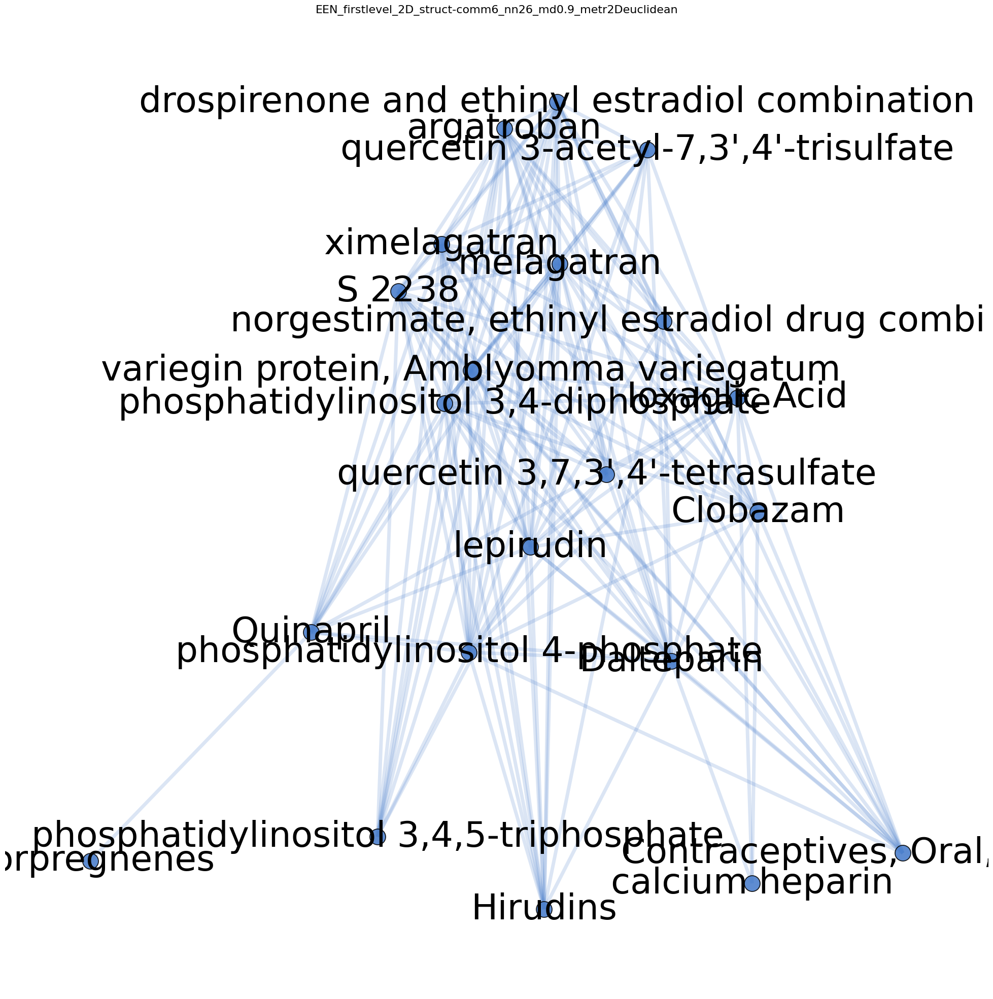

In [122]:

plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

subgraph_label_dict={}
for node in subgraphs_allcommunities_firstlevel[i].nodes():
    subgraph_label_dict[node]=chem_id_name_conversion[node]
    
subgraph_relabel = nx.relabel_nodes(subgraphs_allcommunities_firstlevel[i], subgraph_label_dict)
pos_relabel={}
for nodeid,nodename in subgraph_label_dict.items():
    pos_relabel[nodename]=dict(*pos2D_allcommunities_firstlevel[i])[nodeid]

nx.draw_networkx_labels(subgraph_relabel, pos = pos_relabel,  font_color = 'black',font_size=50)
plt.box(False)


plt.show()